In [2]:
import time, os

In [3]:
!pip install tqdm

In [4]:
from tqdm import tqdm

In [5]:
import math

In [6]:
import numpy as np
import pandas as pd

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.patches as mpatches

In [8]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import ListedColormap
from matplotlib import cm
from mpl_toolkits.mplot3d.axes3d import get_test_data

In [9]:
import seaborn as sns
sns.set_theme()
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [10]:
from sklearn.model_selection import train_test_split

In [14]:
pip install tensorflow

ERROR: Could not find a version that satisfies the requirement tensorflow (from versions: none)
ERROR: No matching distribution found for tensorflow
Note: you may need to restart the kernel to use updated packages.


In [15]:
import tensorflow as tf
from tensorflow import keras


ModuleNotFoundError: No module named 'tensorflow'

In [16]:
start = time.time()

In [18]:
data_train = pd.read_csv('/Users/sreeajay/Downloads/Dataset/training.csv')
print(pd.Series({"Memory usage": "{:.2f} MB".format(data_train.memory_usage().sum()/(1024*1024)),
                 "Dataset shape": "{}".format(data_train.shape)}).to_string())
print(" ")
data_train.head()

Memory usage         62.94 MB
Dataset shape    (250000, 33)
 


,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,...,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,...,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,...,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,...,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,...,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [19]:
X = data_train.drop(columns = ["Label", "EventId", "Weight"])
y = data_train["Label"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, random_state=20)
data_train = pd.concat([X_train, y_train], axis=1)
data_test = pd.concat([X_test, y_test], axis=1)

In [20]:
print(pd.Series({"Shape of the training set": data_train.shape,
                 "Shape of the test set": data_test.shape}).to_string())

Shape of the training set    (162500, 31)
Shape of the test set         (87500, 31)


In [21]:
df_obs = pd.DataFrame(index = ['Number of observations'], columns = ['Training set', 'Test set'])
df_obs['Training set'] = len(data_train)
df_obs['Test set'] = len(data_test)
df_obs

,Training set,Test set
Number of observations,162500,87500


In [22]:
df_cols_count = pd.DataFrame(index = ['Number of columns'], columns = ['Training set', 'Test set'])
df_cols_count['Training set'] = len(data_train.columns)
df_cols_count['Test set'] = len(data_test.columns)
df_cols_count

,Training set,Test set
Number of columns,31,31


In [23]:
data_train.columns

Index(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt',
       'Label'],
      dtype='object')

In [24]:
data_test.columns

Index(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt',
       'Label'],
      dtype='object')

In [25]:
[col for col in data_train.columns if col not in data_test.columns]

[]

In [26]:
data_train.dtypes

DER_mass_MMC                   float64
DER_mass_transverse_met_lep    float64
DER_mass_vis                   float64
DER_pt_h                       float64
DER_deltaeta_jet_jet           float64
DER_mass_jet_jet               float64
DER_prodeta_jet_jet            float64
DER_deltar_tau_lep             float64
DER_pt_tot                     float64
DER_sum_pt                     float64
DER_pt_ratio_lep_tau           float64
DER_met_phi_centrality         float64
DER_lep_eta_centrality         float64
PRI_tau_pt                     float64
PRI_tau_eta                    float64
PRI_tau_phi                    float64
PRI_lep_pt                     float64
PRI_lep_eta                    float64
PRI_lep_phi                    float64
PRI_met                        float64
PRI_met_phi                    float64
PRI_met_sumet                  float64
PRI_jet_num                      int64
PRI_jet_leading_pt             float64
PRI_jet_leading_eta            float64
PRI_jet_leading_phi      

In [27]:
df_cols_train = pd.DataFrame(index = ['Number of columns for the training set'], columns = ['Integer', 'Float', 'Object'])
df_cols_train['Integer'] = len(data_train.columns[data_train.dtypes == 'int64'])
df_cols_train['Float'] = len(data_train.columns[data_train.dtypes == 'float64'])
df_cols_train['Object'] = len(data_train.columns[data_train.dtypes == 'object'])
df_cols_train

,Integer,Float,Object
Number of columns for the training set,1,29,1


In [28]:
data_train.columns[data_train.dtypes == 'int64']

Index(['PRI_jet_num'], dtype='object')

In [29]:
data_train.columns[data_train.dtypes == 'object']

Index(['Label'], dtype='object')

In [30]:
df_cols_test = pd.DataFrame(index = ['Number of columns for the test set'], columns = ['Integer', 'Float', 'Object'])
df_cols_test['Integer'] = len(data_test.columns[data_test.dtypes == 'int64'])
df_cols_test['Float'] = len(data_test.columns[data_test.dtypes == 'float64'])
df_cols_test['Object'] = len(data_test.columns[data_test.dtypes == 'object'])
df_cols_test

,Integer,Float,Object
Number of columns for the test set,1,29,1


In [31]:
df_duplicate_rows = pd.DataFrame(index = ['Number of duplicate rows'], columns = ['Training set', 'Test set'])
df_duplicate_rows['Training set'] = data_train.duplicated().sum()
df_duplicate_rows['Test set'] = data_test.duplicated().sum()
df_duplicate_rows

,Training set,Test set
Number of duplicate rows,0,0


In [32]:
cols_constant_train = data_train.columns[data_train.nunique() == 1].tolist()
if len(cols_constant_train) == 0:
    cols_constant_train = "None"
print(pd.Series({"Constant columns in the training set": cols_constant_train}).to_string())

Constant columns in the training set    None


In [33]:
cols_constant_test = data_test.columns[data_test.nunique() == 1].tolist()
if len(cols_constant_test) == 0:
    cols_constant_test = "None"
print(pd.Series({"Constant columns in the test set": cols_constant_test}).to_string())

Constant columns in the test set    None


In [34]:
df_missing = pd.DataFrame(index = ['Number of columns with missing values'], columns = ['Training set', 'Test set'])
df_missing['Training set'] = len(data_train.isna().sum()[data_train.isna().sum() != 0])
df_missing['Test set'] = len(data_test.isna().sum()[data_test.isna().sum() != 0])
df_missing

,Training set,Test set
Number of columns with missing values,0,0


In [35]:
data_train.describe()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
count,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,...,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000,162500.000000
mean,-48.505199,49.122103,81.107993,57.870895,-708.370429,-601.136503,-709.305705,2.373122,18.895170,158.325010,...,-0.012203,209.513560,0.979083,-348.643027,-399.542483,-399.544149,-692.350653,-709.070061,-709.067374,72.980641
std,405.803580,35.263830,40.279260,63.687149,454.504984,657.992923,453.045485,0.782198,22.569552,115.236362,...,1.811175,126.010813,0.977818,533.012926,489.395729,489.394428,479.861947,453.411212,453.415147,97.654781
min,-999.000000,0.000000,7.330000,0.000000,-999.000000,-999.000000,-999.000000,0.228000,0.000000,46.229000,...,-3.142000,13.678000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-0.000000
25%,78.208500,19.143750,59.384000,14.021000,-999.000000,-999.000000,-999.000000,1.809000,2.822000,77.450000,...,-1.574000,122.931750,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000
50%,104.980500,46.396500,73.755500,38.469000,-999.000000,-999.000000,-999.000000,2.492000,12.258000,120.590000,...,-0.025000,179.545500,1.000000,38.925000,-1.878000,-2.095000,-999.000000,-999.000000,-999.000000,40.461000
75%,130.667000,73.475000,92.212000,79.033500,0.496000,83.394500,-4.575000,2.961000,27.589000,200.660750,...,1.553000,263.307250,2.000000,75.349000,0.430000,0.504000,33.724250,-2.449000,-2.269000,110.206250
max,1192.026000,595.819000,1034.205000,2834.999000,8.326000,4974.979000,16.690000,5.626000,2834.999000,1675.449000,...,3.142000,1733.037000,3.000000,755.235000,4.492000,3.141000,569.834000,4.498000,3.142000,1448.361000


In [36]:
data_train.describe(include = ['O'])

,Label
count,162500
unique,2
top,b
freq,106702


In [37]:
data_test.describe()


,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt
count,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,...,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000,87500.000000
mean,-49.984857,49.458434,81.319389,57.942514,-708.513991,-601.423781,-709.451128,2.373059,18.958491,158.631316,...,-0.006250,210.323896,0.979349,-347.747428,-398.719142,-398.731688,-692.437940,-709.217342,-709.213822,73.220498
std,407.351003,35.494093,41.829805,63.597538,454.437796,657.937723,452.974887,0.784238,21.713032,116.573891,...,1.814171,127.401152,0.976704,532.872223,489.233934,489.223781,479.903394,453.337818,453.343062,98.682739
min,-999.000000,0.000000,6.329000,0.000000,-999.000000,-999.000000,-999.000000,0.208000,0.000000,46.104000,...,-3.142000,17.931000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-0.000000
25%,77.913500,19.452000,59.397500,14.166500,-999.000000,-999.000000,-999.000000,1.813000,2.873000,77.780750,...,-1.576000,123.196250,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,0.000000
50%,105.076000,46.786000,73.741500,38.462500,-999.000000,-999.000000,-999.000000,2.490000,12.455500,120.792500,...,-0.021000,180.086500,1.000000,39.031500,-1.860000,-2.091000,-999.000000,-999.000000,-999.000000,40.610000
75%,130.496500,73.827250,92.346000,79.532000,0.480000,83.543000,-4.618000,2.961250,27.592250,200.138250,...,1.574000,263.593000,2.000000,75.349250,0.437000,0.502000,33.670000,-2.472000,-2.289000,109.537750
max,977.515000,690.075000,1349.351000,1053.807000,8.503000,3983.921000,15.790000,5.684000,513.659000,1852.462000,...,3.141000,2003.976000,3.000000,1120.573000,4.499000,3.141000,721.456000,4.500000,3.142000,1633.433000


In [38]:
grey_patch = mpatches.Patch(color = 'grey', label = "Train")
red_patch = mpatches.Patch(color = 'red', label = "Test")

In [39]:
def bar_donut(df, col, h = 500, w = 800):
    fig = make_subplots(rows = 1, cols = 2, specs = [[{'type': 'xy'}, {'type': 'domain'}]])
    x_val, y_val = df[col].value_counts(sort = False).index.tolist(), df[col].value_counts(sort = False).tolist()
    fig.add_trace(go.Bar(x = x_val, y = y_val, text = y_val, textposition = 'auto'), row = 1, col = 1)
    fig.add_trace(go.Pie(values = y_val, labels = x_val, hole = 0.5, textinfo = 'label+percent', title = f"{col}"), row = 1, col = 2)
    fig.update_layout(height = h, width = w, showlegend = False, xaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 1), title = dict(text = f"Frequency distribution of {col}", x = 0.5, y = 0.95)) 
    fig.show()

In [40]:
bar_donut(data_train, 'Label')

In [41]:
data_train_b = data_train[data_train['Label'] == 'b'] # Background events in the training set
data_train_s = data_train[data_train['Label'] == 's'] # System events in the training set

In [42]:
df_unique = pd.DataFrame()
df_unique['Training set (background events)'] = [data_train_b[col].nunique() for col in data_test.columns]
df_unique['Training set (signal events)'] = [data_train_s[col].nunique() for col in data_test.columns]
df_unique['Training set (all events)'] = [data_train[col].nunique() for col in data_test.columns]
df_unique['Test set (all events)'] = [data_test[col].nunique() for col in data_test.columns]
df_unique.set_index(data_test.columns, inplace = True)
df_unique.style.set_caption("Number of unique values for the predictor variables")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,62887,39102,85285,55927
DER_mass_transverse_met_lep,69142,38729,85351,60192
DER_mass_vis,68247,37712,82232,57926
DER_pt_h,64445,45848,90476,59931
DER_deltaeta_jet_jet,5280,6483,6780,6282
DER_mass_jet_jet,25292,20882,45366,24820
DER_prodeta_jet_jet,9753,11120,14417,11177
DER_deltar_tau_lep,4509,3285,4514,4307
DER_pt_tot,41515,28905,49928,37487
DER_sum_pt,81578,50566,116715,72259


In [43]:
def minus_999(df):
    index = [col for col in df.columns if -999 in df[col].value_counts().index]
    data = [df[col].value_counts()[-999]/len(df) for col in index]
    return pd.Series(index = index, data = data).sort_values(ascending = False)

df_minus_999 = pd.DataFrame()
df_minus_999['Training set (background events)'] = minus_999(data_train_b).values
df_minus_999['Training set (signal events)'] = minus_999(data_train_s).values
df_minus_999['Training set (all events)'] = minus_999(data_train).values
df_minus_999['Test set (all events)'] = minus_999(data_test).values
df_minus_999.set_index(minus_999(data_train).index, inplace = True)
df_minus_999.style.set_caption("Proportion of the value -999 in the dataset columns which contain -999")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_deltaeta_jet_jet,0.755937,0.621510,0.709778,0.709920
DER_mass_jet_jet,0.755937,0.621510,0.709778,0.709920
DER_prodeta_jet_jet,0.755937,0.621510,0.709778,0.709920
DER_lep_eta_centrality,0.755937,0.621510,0.709778,0.709920
PRI_jet_subleading_pt,0.755937,0.621510,0.709778,0.709920
PRI_jet_subleading_eta,0.755937,0.621510,0.709778,0.709920
PRI_jet_subleading_phi,0.755937,0.621510,0.709778,0.709920
PRI_jet_leading_pt,0.453300,0.297896,0.399938,0.399120
PRI_jet_leading_eta,0.453300,0.297896,0.399938,0.399120
PRI_jet_leading_phi,0.453300,0.297896,0.399938,0.399120


In [44]:
 data_train_temp = data_train.copy(deep = True)
 data_train_temp['dataset'] = "Train"
 data_test_temp = data_test.copy(deep = True)
 data_test_temp['dataset'] = "Test"
 data = pd.concat([data_train_temp, data_test_temp], axis = 0, ignore_index = True)

In [45]:
def hist(df, cols, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = df, x = cols[i], bins = bins, hue = 'dataset', palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

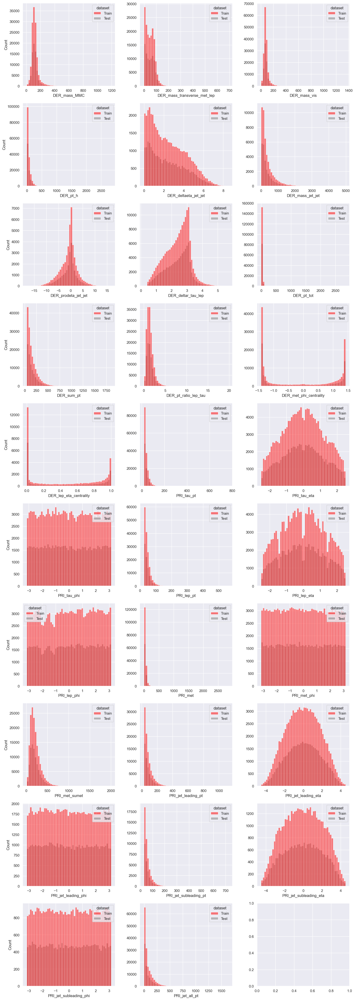

In [46]:
hist(data.replace(-999, np.nan),
     list(data_test.columns[data_test.dtypes == 'float64']),
     bins = max(math.floor(len(data_train)**(1/3)), math.floor(len(data_test)**(1/3))),
     ncols = 3)

In [47]:
def hist_target(df, cols, target, bins, ncols = 3):
    nrows = math.ceil(len(cols) / ncols)
    fig, ax = plt.subplots(nrows, ncols, figsize = (5 * ncols, 4.2 * nrows), sharey = False)
    for i in range(len(cols)):
        sns.histplot(data = df, x = cols[i], bins = bins, hue = target, palette = ['red', 'grey'], ax = ax[i // ncols, i % ncols])
        ax[i // ncols, i % ncols].set_xlabel(cols[i])
        if i % ncols != 0:
            ax[i // ncols, i % ncols].set_ylabel(" ")
    plt.tight_layout()
    plt.show()

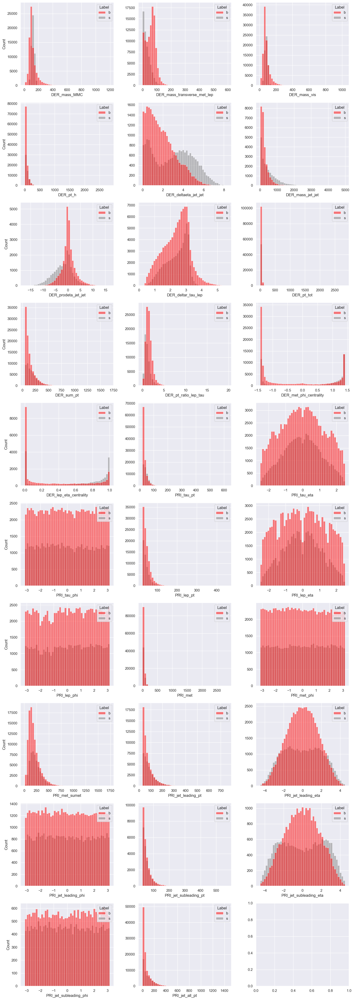

In [48]:
hist_target(data_train.replace(-999, np.nan),
     list(data_test.columns[data_test.dtypes == 'float64']),
     target = 'Label',
     bins = max(math.floor(len(data_train_b)**(1/3)), math.floor(len(data_train_s)**(1/3))),
     ncols = 3)

In [49]:
df_skew = pd.DataFrame()
cols_float_test = data_test.columns[data_test.dtypes == 'float64']
skew_train_b = data_train_b.replace(-999, np.nan)[cols_float_test].skew().values
skew_train_s = data_train_s.replace(-999, np.nan)[cols_float_test].skew().values
skew_train = data_train.replace(-999, np.nan)[cols_float_test].skew().values
skew_test = data_test.replace(-999, np.nan)[cols_float_test].skew().values
df_skew['Training set (background events)'], df_skew['Training set (signal events)'] = skew_train_b, skew_train_s
df_skew['Training set (all events)'], df_skew['Test set (all events)'] = skew_train, skew_test
df_skew.set_index(np.array(cols_float_test), inplace = True)
df_skew.style.set_caption("Skewness of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,3.273079,5.042331,3.840310,3.746742
DER_mass_transverse_met_lep,0.891302,2.664844,1.197725,1.258181
DER_mass_vis,3.073129,3.975441,3.486290,4.288757
DER_pt_h,2.410808,2.691850,2.685350,2.274365
DER_deltaeta_jet_jet,0.801677,0.096624,0.573147,0.584397
DER_mass_jet_jet,2.795382,1.790811,2.469273,2.436934
DER_prodeta_jet_jet,0.191957,-0.130758,-0.319899,-0.344265
DER_deltar_tau_lep,-0.115210,-0.523848,-0.217973,-0.211745
DER_pt_tot,2.621785,29.136081,14.263715,2.879007
DER_sum_pt,2.591963,1.909621,2.277999,2.396797


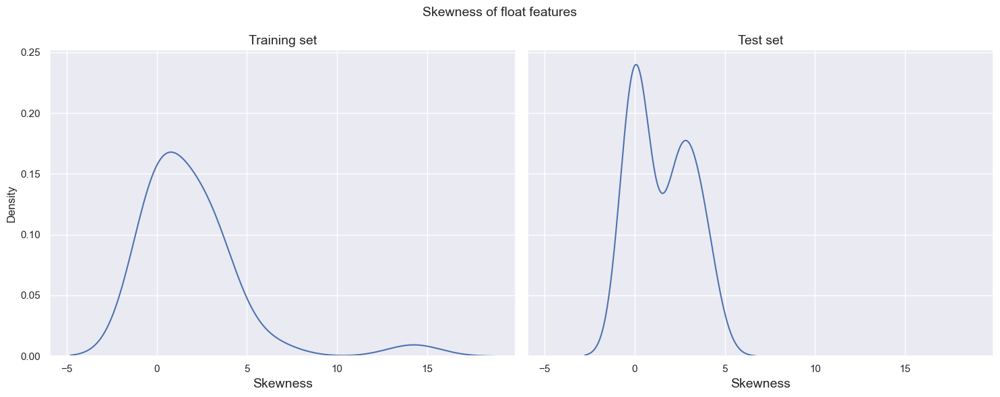

In [50]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_skew, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = df_skew, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features", fontsize = 14)
plt.tight_layout()
plt.show()

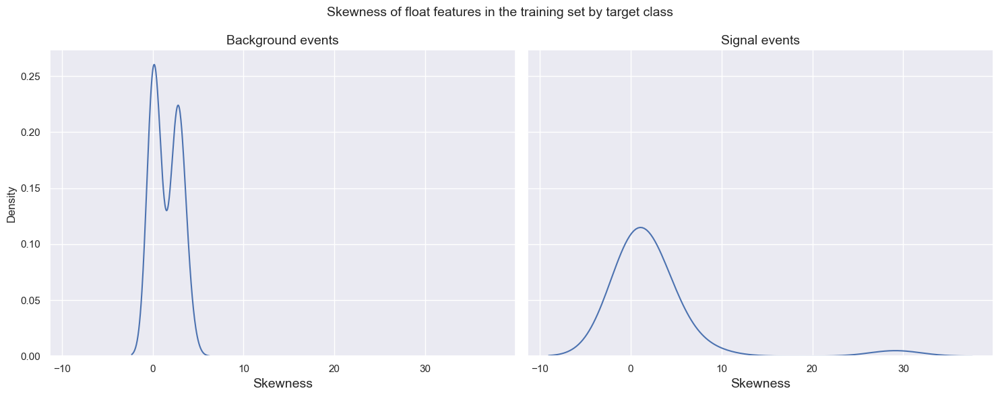

In [51]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_skew, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = df_skew, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Skewness", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Skewness", fontsize = 14)
plt.suptitle("Skewness of float features in the training set by target class", fontsize = 14)
plt.tight_layout()
plt.show()

In [52]:
df_kurt = pd.DataFrame()
kurt_train_b = data_train_b.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train_s = data_train_s.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_train = data_train.replace(-999, np.nan)[cols_float_test].kurt().values
kurt_test = data_test.replace(-999, np.nan)[cols_float_test].kurt().values
df_kurt['Training set (background events)'], df_kurt['Training set (signal events)'] = kurt_train_b, kurt_train_s
df_kurt['Training set (all events)'], df_kurt['Test set (all events)'] = kurt_train, kurt_test
df_kurt.set_index(np.array(cols_float_test), inplace = True)
df_kurt.style.set_caption("Kurtosis of the float features")

,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
DER_mass_MMC,18.839165,90.449178,28.548909,26.289861
DER_mass_transverse_met_lep,5.759368,17.141578,5.961023,7.099099
DER_mass_vis,18.987458,74.828553,26.589667,49.566159
DER_pt_h,8.985592,38.410590,29.395268,8.269805
DER_deltaeta_jet_jet,0.073362,-1.050039,-0.586165,-0.561171
DER_mass_jet_jet,13.842693,4.333043,8.633744,8.099584
DER_prodeta_jet_jet,2.560215,0.568686,1.453460,1.541257
DER_deltar_tau_lep,-0.215383,-0.616254,-0.231245,-0.206265
DER_pt_tot,15.135073,3143.736315,1503.796313,19.145146
DER_sum_pt,10.632399,6.016367,8.328933,9.733917


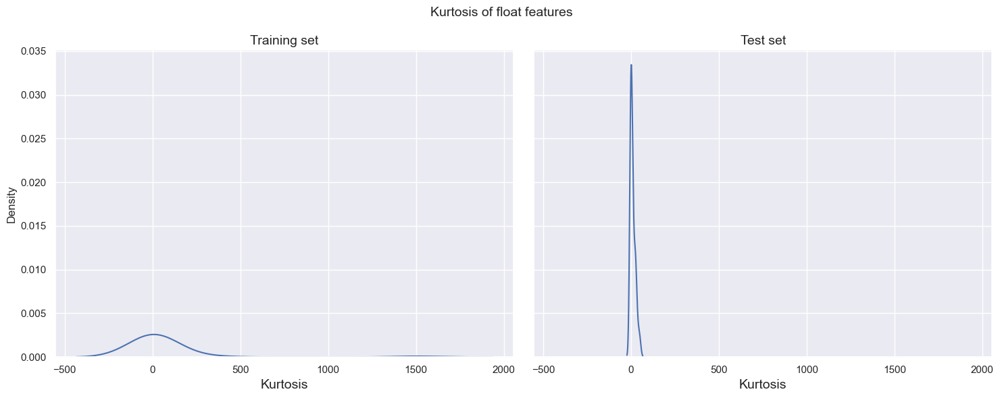

In [53]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_kurt, x = 'Training set (all events)', ax = ax[0])
sns.kdeplot(data = df_kurt, x = 'Test set (all events)', ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features", fontsize = 14)
plt.tight_layout()
plt.show()

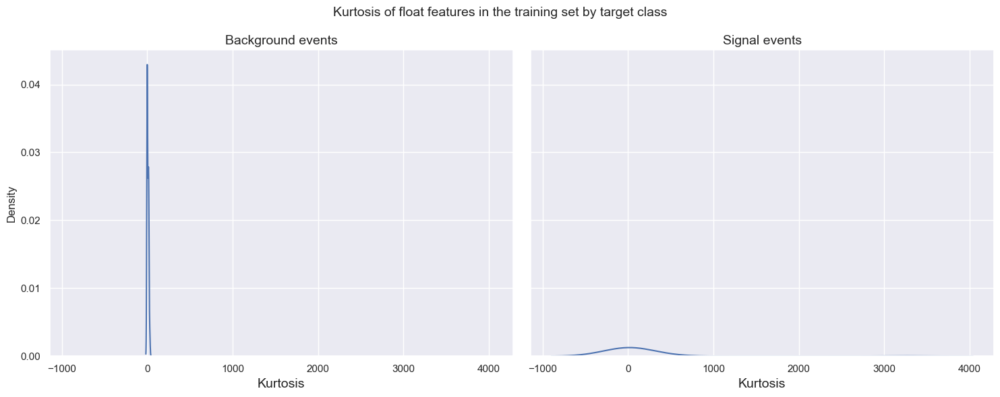

In [54]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_kurt, x = 'Training set (background events)', ax = ax[0])
sns.kdeplot(data = df_kurt, x = 'Training set (signal events)', ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Kurtosis", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Kurtosis", fontsize = 14)
plt.suptitle("Kurtosis of float features in the training set by target class", fontsize = 14)
plt.tight_layout()
plt.show()

In [55]:
def donut(df1, df2, col,text1, text2, title_text = "Title"):
    fig = make_subplots(rows = 1, cols = 2, column_widths = [0.5, 0.5], row_heights = [0.5], specs = [[ {"type": "pie"}, {"type": "pie"}]])
    fig.add_trace(go.Pie(labels = df1[col].value_counts().index, values = df1[col].value_counts(), legendgroup = "group", textinfo = 'percent', hole = 0.3, title = dict(text = text1)), row = 1, col = 1)
    fig.add_trace(go.Pie(labels = df2[col].value_counts().index, values = df2[col].value_counts(), legendgroup = "group", textinfo = 'percent', hole = 0.3, title = dict(text = text2)), row = 1, col = 2)
    fig.update_layout(title = dict(text = title_text, y = 0.9, x = 0.5, xanchor = 'center', yanchor = 'top'))
    fig.show()

In [56]:
donut(data_train, data_test, col = 'PRI_jet_num', text1 = 'Train', text2 = 'Test', title_text = "Frequency comparison of PRI_jet_num")

In [57]:
donut(data_train_b, data_train_s, col = 'PRI_jet_num', text1 = 'Background', text2 = 'Signal', title_text = "Frequency comparison of PRI_jet_num in the training set by target class")

In [58]:
df_corr = pd.DataFrame(columns = ['feature_1', 'feature_2', 'Training set (background events)', 'Training set (signal events)', 'Training set (all events)', 'Test set (all events)'])
cols = cols_float_test
for i in range(len(cols)):
    for j in range(len(cols)):
        if i<j:
            df_corr.loc[len(df_corr.index)] = [cols[i], cols[j], data_train_b[cols[i]].corr(data_train_b[cols[j]]), data_train_s[cols[i]].corr(data_train_s[cols[j]]), data_train[cols[i]].corr(data_train[cols[j]]), data_test[cols[i]].corr(data_test[cols[j]])]
df_corr.sort_values(by = 'Training set (all events)', ascending = False, inplace = True)
df_corr # df_corr.style.set_caption("Correlation coefficient of pairs of float features")

,feature_1,feature_2,Training set (background events),Training set (signal events),Training set (all events),Test set (all events)
113,DER_deltaeta_jet_jet,DER_lep_eta_centrality,0.999999,0.999998,0.999998,0.999998
284,DER_lep_eta_centrality,PRI_jet_subleading_phi,0.999998,0.999997,0.999998,0.999998
283,DER_lep_eta_centrality,PRI_jet_subleading_eta,0.999998,0.999996,0.999997,0.999997
128,DER_deltaeta_jet_jet,PRI_jet_subleading_phi,0.999997,0.999994,0.999996,0.999996
127,DER_deltaeta_jet_jet,PRI_jet_subleading_eta,0.999997,0.999993,0.999995,0.999995
...,...,...,...,...,...,...
176,DER_deltar_tau_lep,DER_sum_pt,-0.299140,-0.755012,-0.434004,-0.430050
195,DER_deltar_tau_lep,PRI_jet_all_pt,-0.334977,-0.732152,-0.449879,-0.446654
0,DER_mass_MMC,DER_mass_transverse_met_lep,-0.412245,-0.476252,-0.455789,-0.455686
237,DER_pt_ratio_lep_tau,PRI_tau_pt,-0.433603,-0.501046,-0.479353,-0.466232


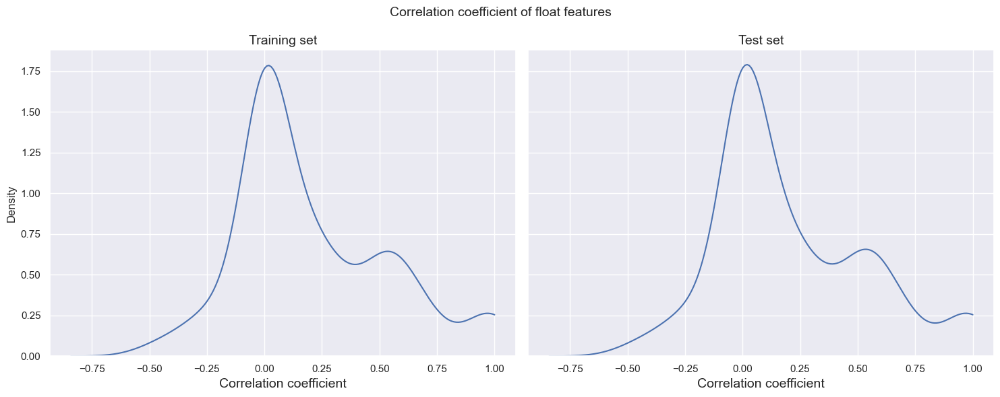

In [59]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_corr, x = 'Training set (all events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = df_corr, x = 'Test set (all events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Training set", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Test set", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of float features", fontsize = 14)
plt.tight_layout()
plt.show()

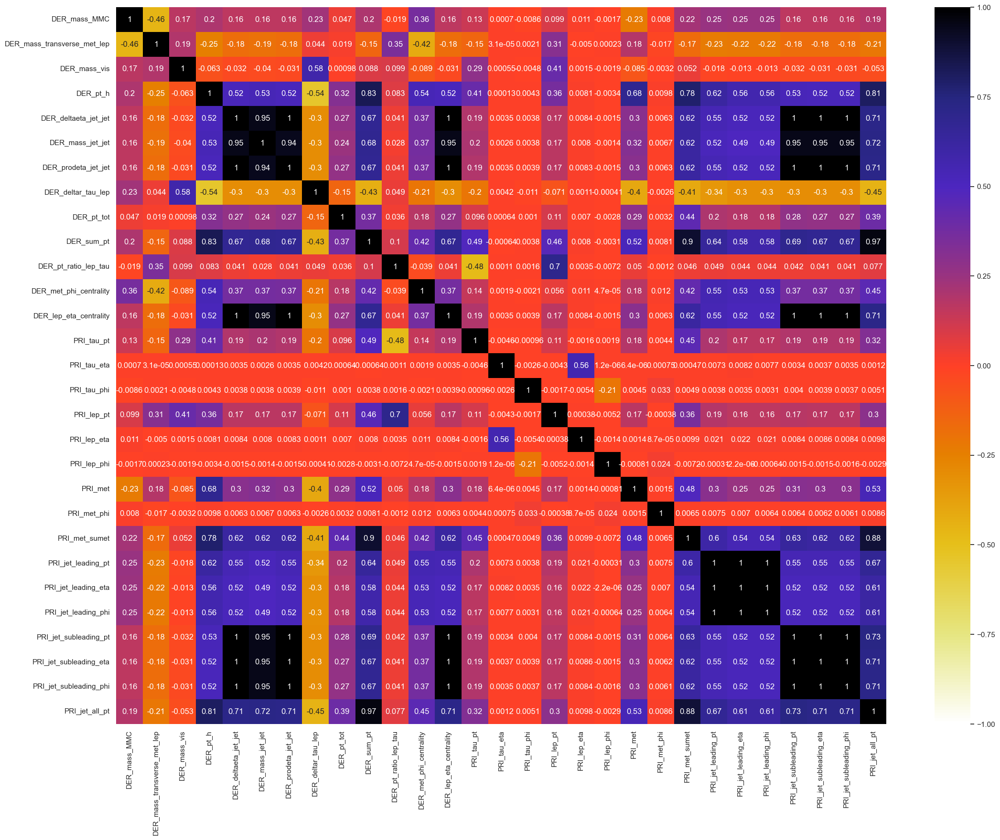

In [60]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(data_train[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)
plt.show()

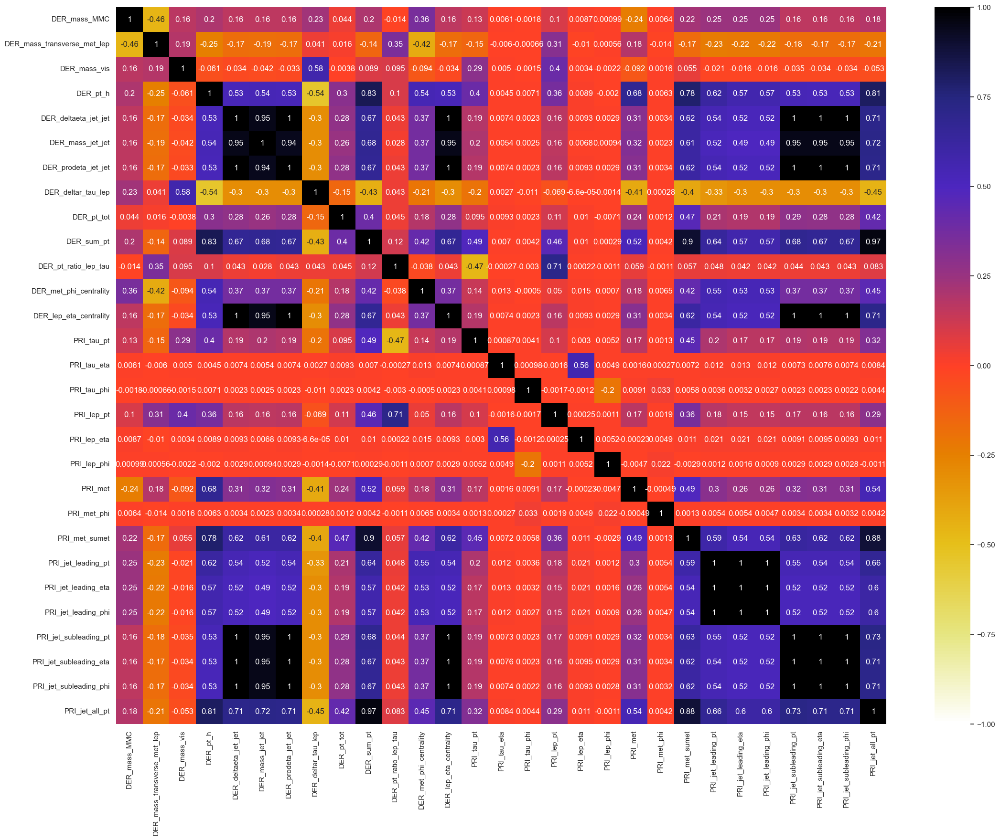

In [61]:
plt.figure(figsize = (26, 19.5))
sns.heatmap(data_test[cols_float_test].corr(), vmin = -1, vmax = 1, annot = True, cmap = plt.cm.CMRmap_r)
plt.show()

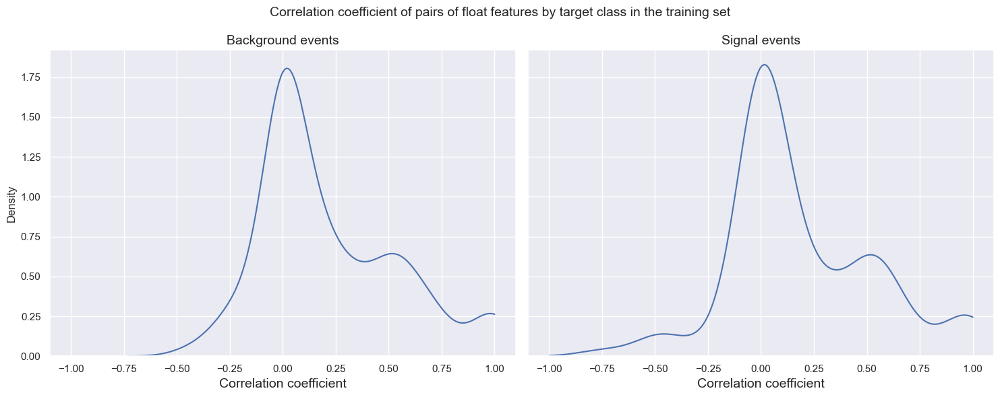

In [62]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
sns.kdeplot(data = df_corr, x = 'Training set (background events)', clip = (-1.0, 1.0), ax = ax[0])
sns.kdeplot(data = df_corr, x = 'Training set (signal events)', clip = (-1.0, 1.0), ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[0].set_xlabel("Correlation coefficient", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
ax[1].set_xlabel("Correlation coefficient", fontsize = 14)
plt.suptitle("Correlation coefficient of pairs of float features by target class in the training set", fontsize = 14)
plt.tight_layout()
plt.show()

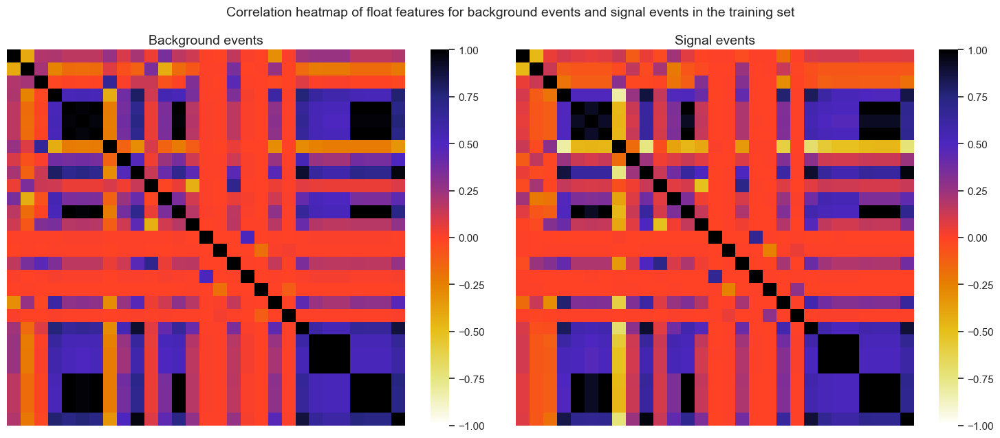

In [63]:
fig, ax = plt.subplots(1, 2, figsize = (15, 6.5), sharex = True, sharey = True)
sns.heatmap(data_train_b[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[0])
sns.heatmap(data_train_s[cols_float_test].corr(), vmin = -1, vmax = 1, annot = False, xticklabels = False, yticklabels = False, cmap = plt.cm.CMRmap_r, ax = ax[1])
ax[0].set_title("Background events", fontsize = 14)
ax[1].set_title("Signal events", fontsize = 14)
plt.suptitle("Correlation heatmap of float features for background events and signal events in the training set", fontsize = 14)
plt.tight_layout()
plt.show()

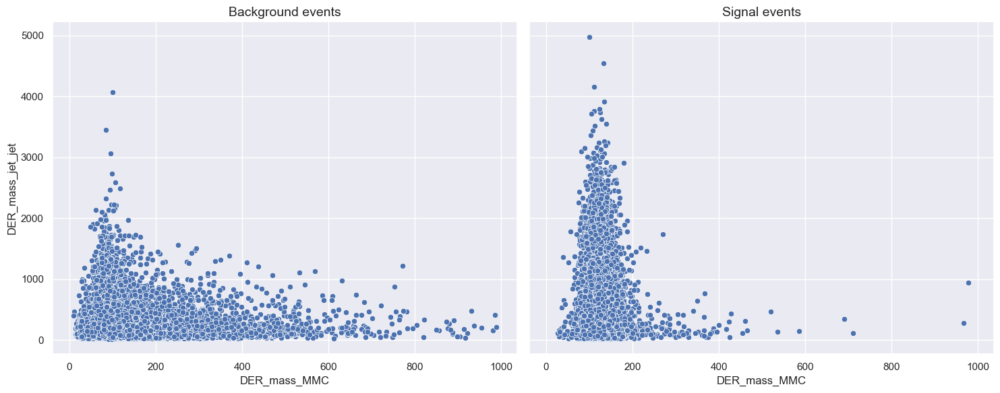

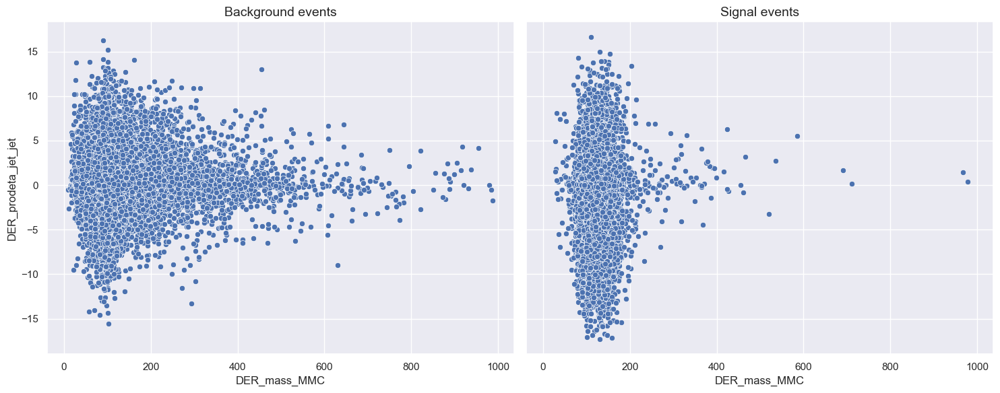

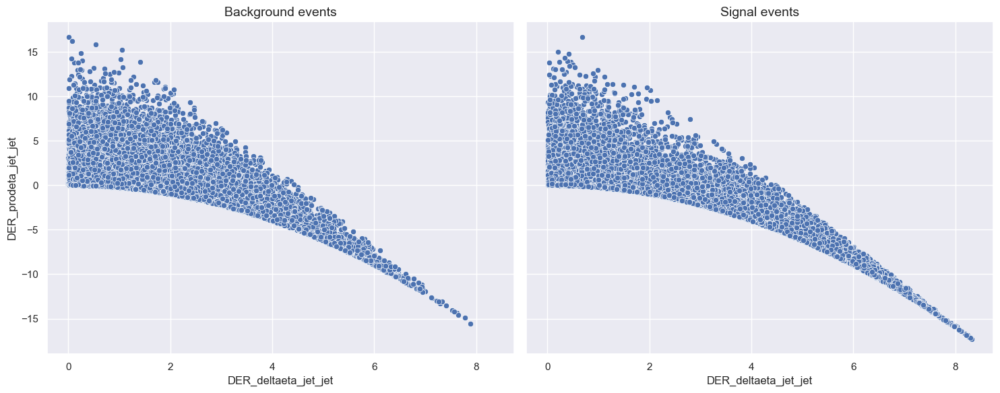

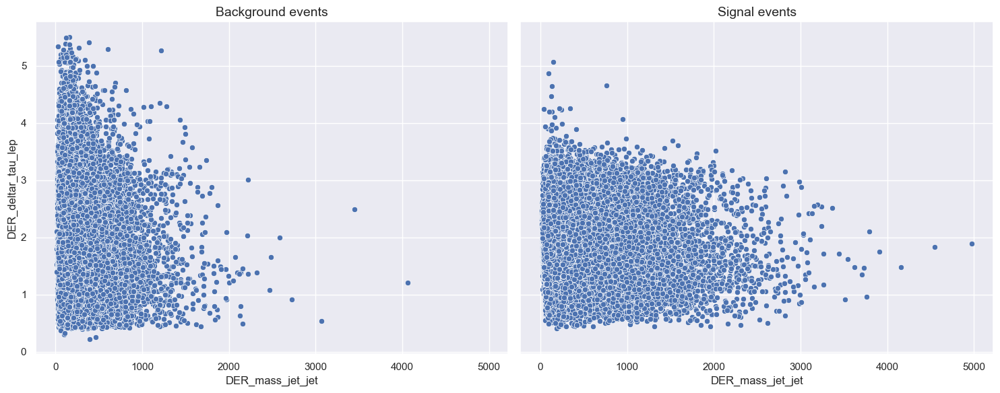

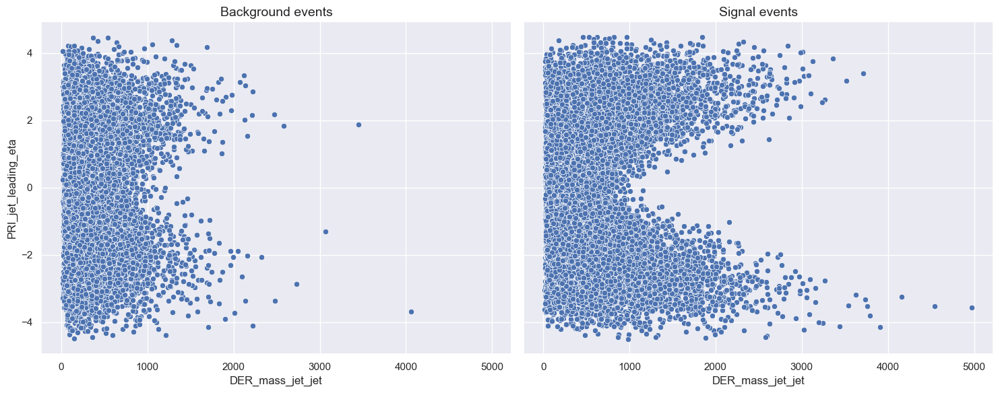

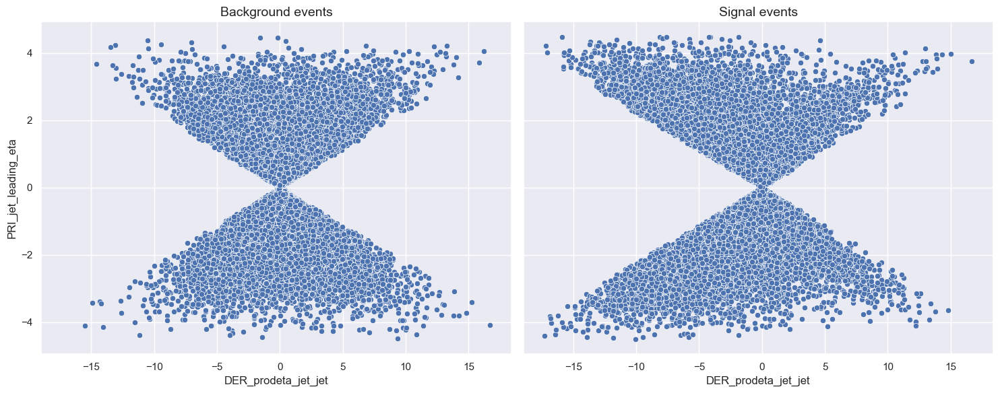

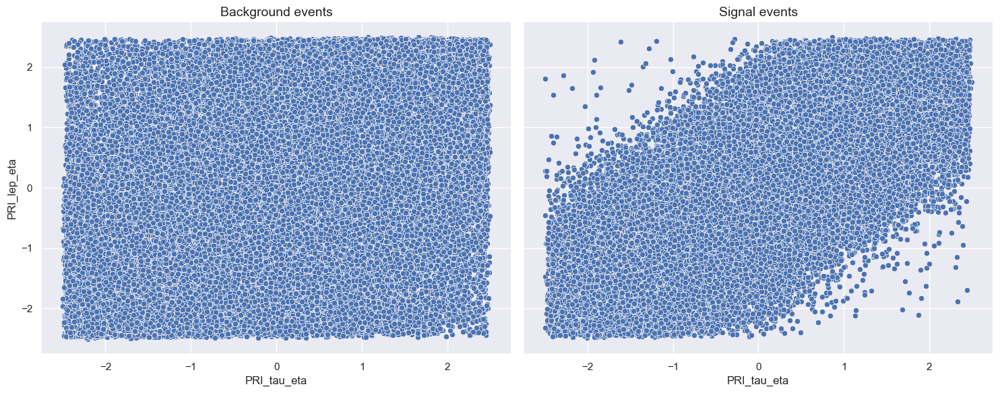

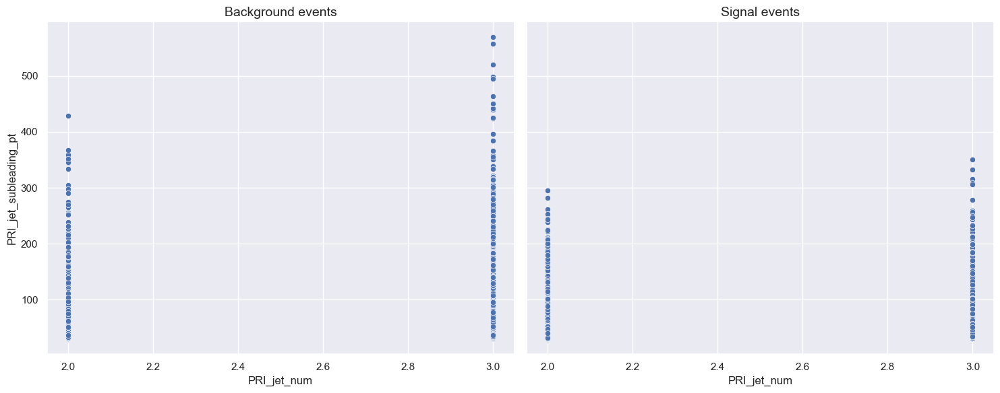

In [64]:
pairs_selected = [
    ('DER_mass_MMC', 'DER_mass_jet_jet'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta'),
    ('DER_prodeta_jet_jet', 'PRI_jet_leading_eta'),
    ('PRI_tau_eta', 'PRI_lep_eta'),
    ('PRI_jet_num', 'PRI_jet_subleading_pt')
]
for z in pairs_selected:
    fig, ax = plt.subplots(1, 2, figsize = (15, 6), sharex = True, sharey = True)
    sns.scatterplot(data = data_train_b.replace(-999, np.nan), x = z[0], y = z[1], ax = ax[0])
    sns.scatterplot(data = data_train_s.replace(-999, np.nan), x = z[0], y = z[1], ax = ax[1])
    ax[0].set_title("Background events", fontsize = 14)
    ax[1].set_title("Signal events", fontsize = 14)
    plt.tight_layout()
plt.show()

/var/folders/9q/9mk9_ykd2pddfxr90n09qy940000gn/T/ipykernel_76659/909916366.py:31: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



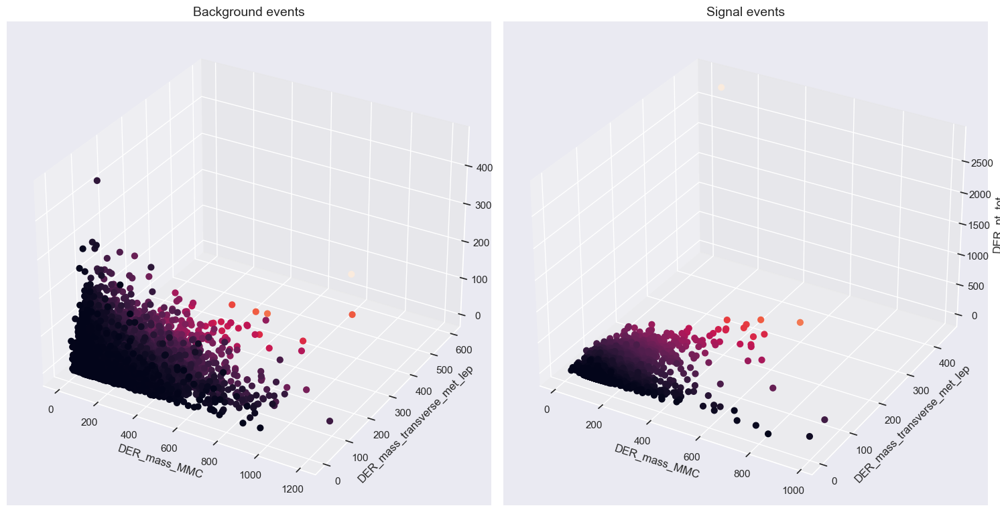

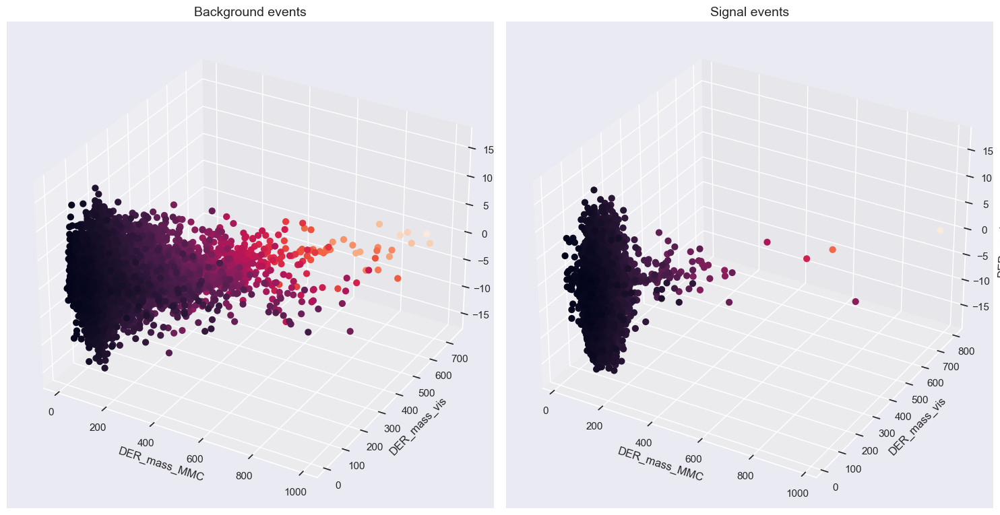

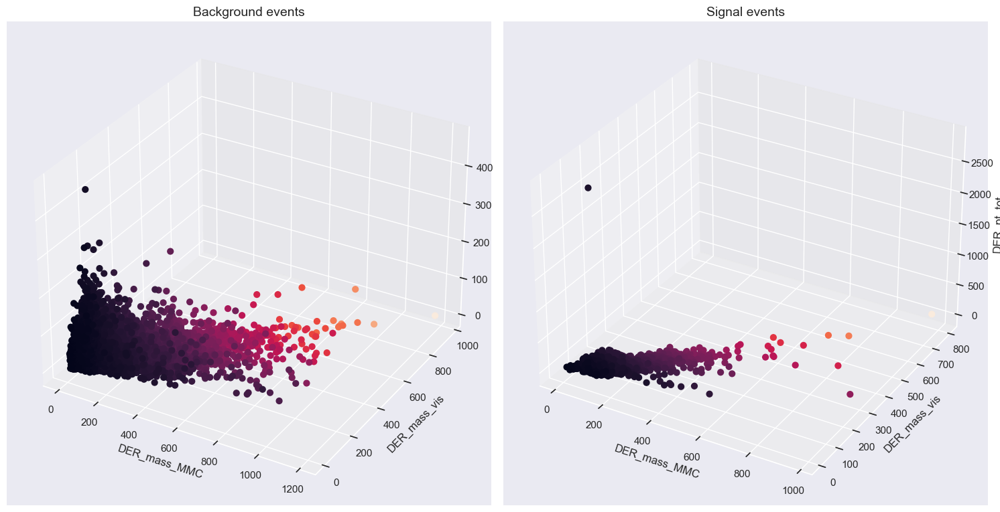

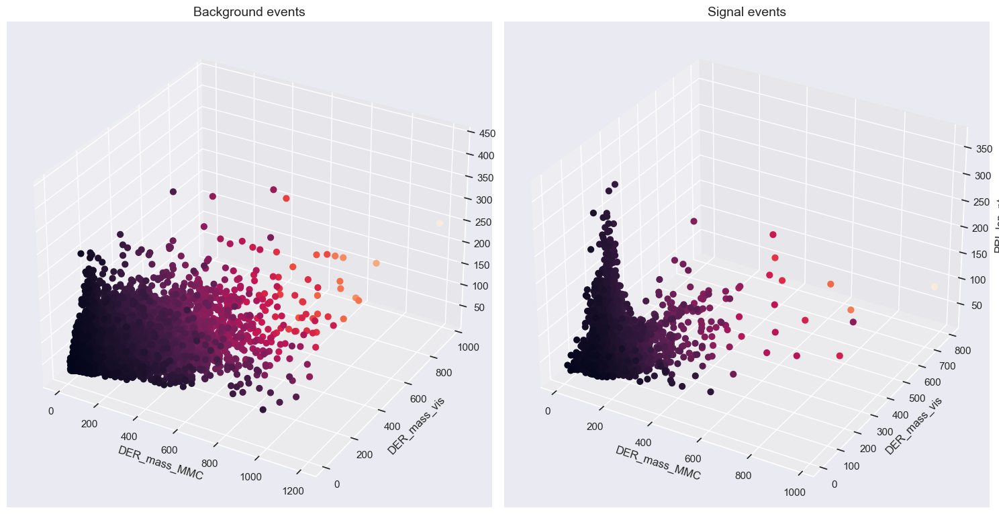

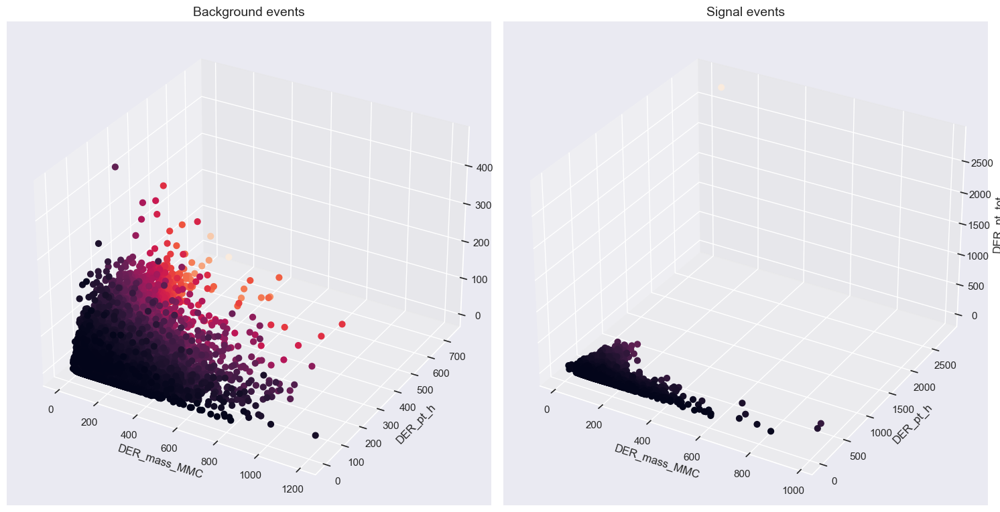

...

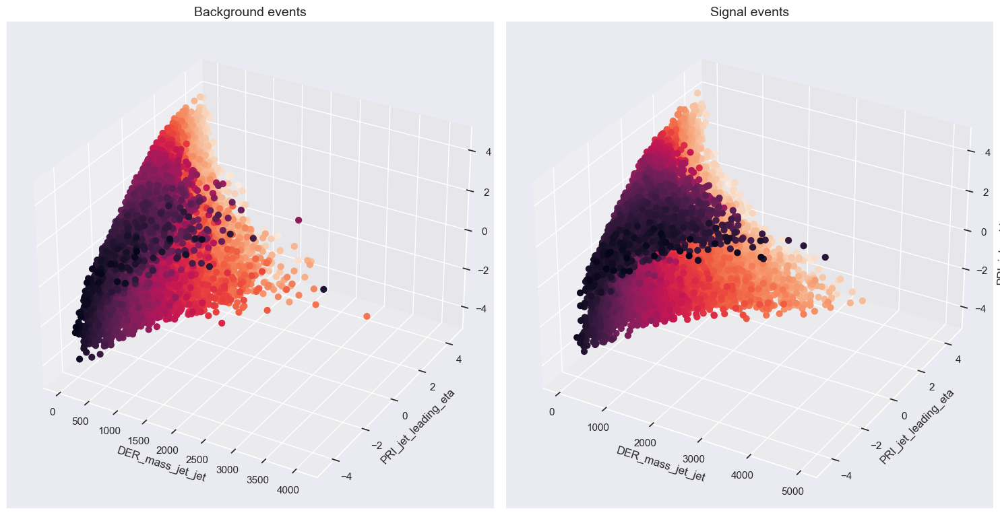

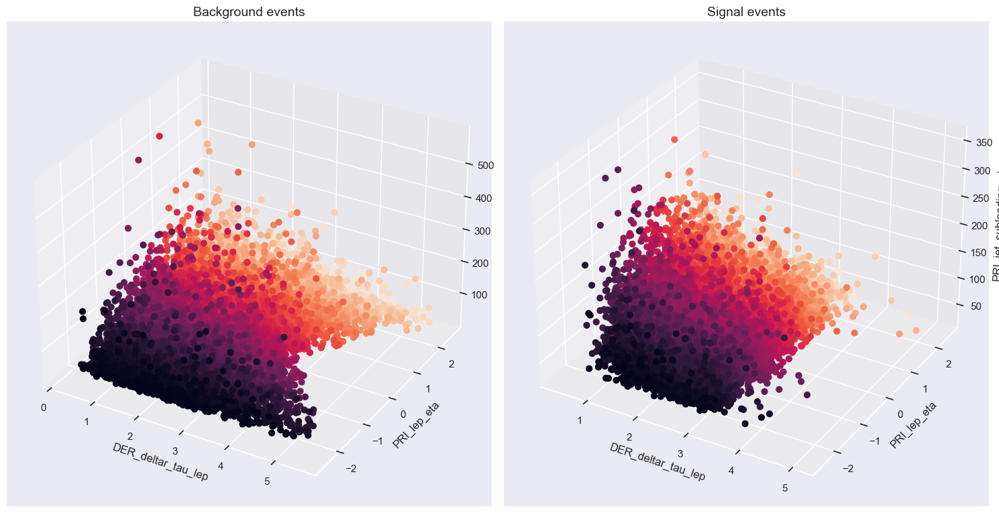

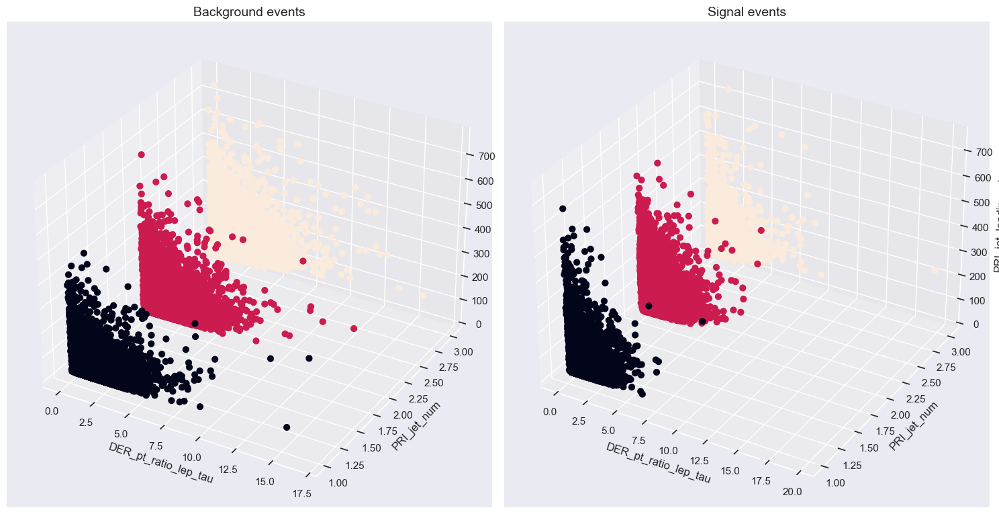

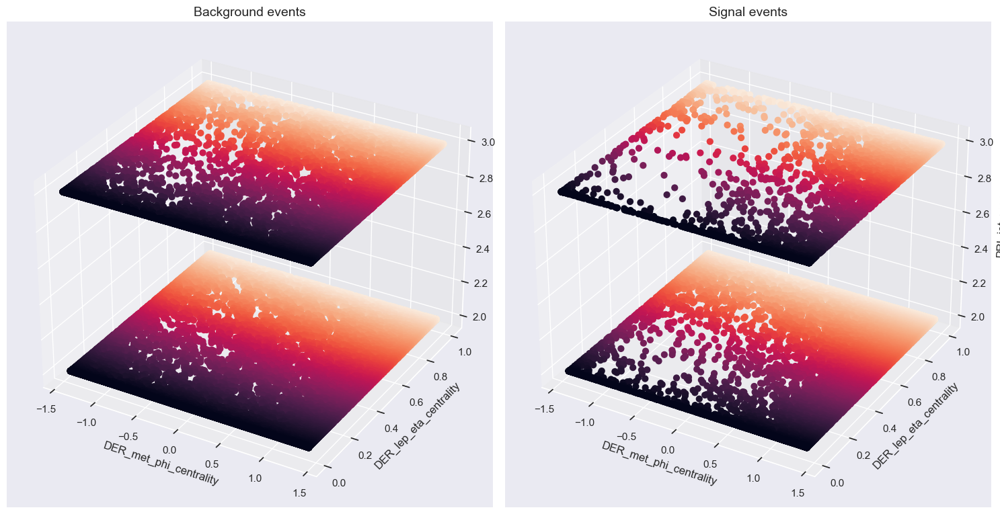

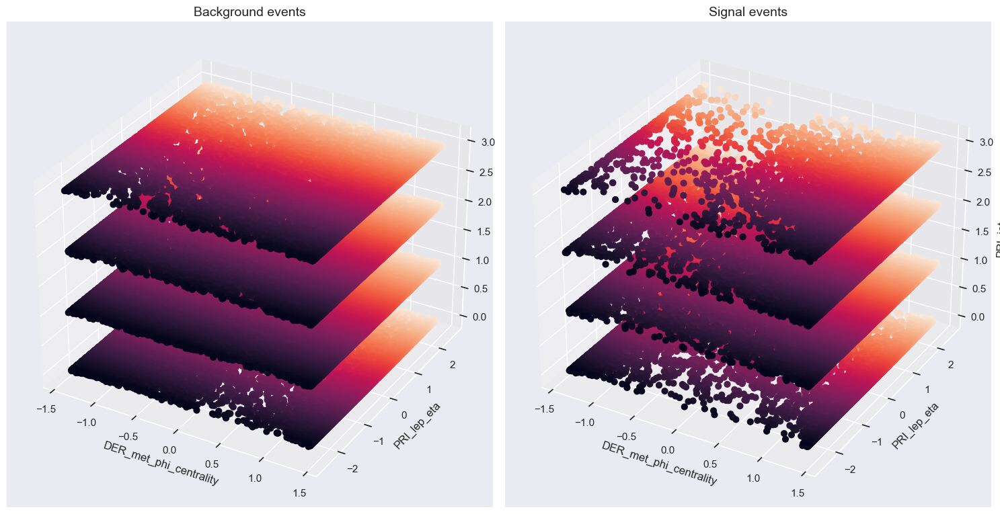

In [65]:
triples_selected = [
    ('DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_prodeta_jet_jet'),
    ('DER_mass_MMC', 'DER_mass_vis', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_mass_vis', 'PRI_lep_pt'),
    ('DER_mass_MMC', 'DER_pt_h', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_pt_h', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'DER_deltaeta_jet_jet', 'PRI_jet_num'),
    ('DER_mass_MMC', 'DER_mass_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_mass_MMC', 'DER_prodeta_jet_jet', 'DER_pt_tot'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_met'),
    ('DER_mass_MMC', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_mass_MMC', 'PRI_met_phi', 'PRI_jet_subleading_pt'),
    ('DER_mass_MMC', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_mass_vis', 'DER_pt_h', 'PRI_jet_leading_pt'),
    ('DER_pt_h', 'PRI_jet_num', 'PRI_jet_leading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_eta'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_subleading_phi'),
    ('DER_deltaeta_jet_jet', 'DER_prodeta_jet_jet', 'PRI_jet_all_pt'),
    ('DER_deltaeta_jet_jet', 'DER_met_phi_centrality', 'PRI_jet_num'),
    ('DER_mass_jet_jet', 'DER_deltar_tau_lep', 'PRI_lep_pt'),
    ('DER_mass_jet_jet', 'PRI_tau_pt', 'PRI_jet_subleading_eta'),
    ('DER_prodeta_jet_jet', 'DER_sum_pt', 'PRI_jet_all_pt'),
    ('DER_mass_jet_jet', 'PRI_jet_leading_eta', 'PRI_jet_subleading_eta'),
    ('DER_deltar_tau_lep', 'PRI_lep_eta', 'PRI_jet_subleading_pt'),
    ('DER_pt_ratio_lep_tau', 'PRI_jet_num', 'PRI_jet_leading_pt'),
    ('DER_met_phi_centrality', 'DER_lep_eta_centrality', 'PRI_jet_num'),
    ('DER_met_phi_centrality', 'PRI_lep_eta', 'PRI_jet_num')
]
for z in triples_selected:
    fig = plt.figure(figsize = (15, 9))
    ax = fig.add_subplot(1, 2, 1, projection = '3d')
    x_b = data_train_b.replace(-999, np.nan)[z[0]]
    y_b = data_train_b.replace(-999, np.nan)[z[1]]
    z_b = data_train_b.replace(-999, np.nan)[z[2]]
    s1 = ax.scatter(x_b, y_b, z_b, s = 40, marker = 'o', c = y_b, alpha = 1)
    ax.set_title("Background events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1]) # ax.set_zlabel(z[2])
    ax = fig.add_subplot(1, 2, 2, projection = '3d')
    x_s = data_train_s.replace(-999, np.nan)[z[0]]
    y_s = data_train_s.replace(-999, np.nan)[z[1]]
    z_s = data_train_s.replace(-999, np.nan)[z[2]]
    s2 = ax.scatter(x_s, y_s, z_s, s = 40, marker = 'o', c = y_s, alpha = 1)
    ax.set_title("Signal events", fontsize = 14)
    ax.set_xlabel(z[0])
    ax.set_ylabel(z[1])
    ax.set_zlabel(z[2])
    plt.tight_layout()
plt.show()

In [66]:
data_train.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Label
229462,86.104,35.695,71.848,46.944,-999.0,-999.0,-999.0,2.082,46.944,60.557,...,175.293,0,-999.000,-999.000,-999.000,-999.0,-999.0,-999.0,0.000,b
48744,105.082,77.535,71.954,67.413,-999.0,-999.0,-999.0,2.295,56.831,148.768,...,232.430,1,72.015,2.765,0.723,-999.0,-999.0,-999.0,72.015,s
229702,56.116,40.508,42.810,34.909,-999.0,-999.0,-999.0,1.572,1.957,93.030,...,117.873,1,34.077,-2.112,0.367,-999.0,-999.0,-999.0,34.077,b
1463,226.599,39.495,153.789,47.582,-999.0,-999.0,-999.0,3.704,47.582,70.582,...,141.689,0,-999.000,-999.000,-999.000,-999.0,-999.0,-999.0,0.000,b
248187,91.745,50.587,62.389,70.780,-999.0,-999.0,-999.0,2.004,5.926,145.758,...,248.518,1,76.318,-2.289,2.041,-999.0,-999.0,-999.0,76.318,b


In [67]:
data_train = data_train.replace(-999, np.nan)
data_train = data_train.fillna(data_train.mean())

/var/folders/9q/9mk9_ykd2pddfxr90n09qy940000gn/T/ipykernel_76659/1383548184.py:2: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



In [68]:
data_test = data_test.replace(-999, np.nan)
data_test = data_test.fillna(data_train.mean())

/var/folders/9q/9mk9_ykd2pddfxr90n09qy940000gn/T/ipykernel_76659/4083061286.py:2: FutureWarning:

The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.



In [69]:
data_test.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Label
41250,77.471000,76.510,64.829,2.473,2.405936,371.895829,-0.816692,2.372,2.473,71.101,...,152.843,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,0.000,b
10116,111.690000,67.650,106.165,2.163,2.405936,371.895829,-0.816692,2.947,2.163,75.038,...,109.156,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,0.000,b
23059,102.060000,74.748,81.755,213.688,1.809000,763.536000,-0.432000,0.848,28.365,773.517,...,863.374,2,342.401000,-0.283000,2.380000,212.719000,1.526000,-1.31500,555.120,b
114138,121.825842,70.386,84.337,0.206,2.405936,371.895829,-0.816692,3.032,0.206,63.846,...,25.530,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,-0.000,b
241994,110.104000,82.049,48.833,147.207,5.503000,1197.072000,-6.698000,1.374,22.902,246.401,...,301.255,2,97.989000,1.818000,-2.002000,59.916000,-3.685000,-2.80400,157.904,s


In [70]:
num_features = data_train.select_dtypes(include = ['float64', 'int64']).columns
cat_features = data_train.select_dtypes(include = ['object']).columns

In [71]:
for i in num_features:
    q1 = data_train[i].quantile(0.25)
    q3 = data_train[i].quantile(0.75)
    iqr = q3 - q1
    data_train = data_train[(data_train[i] >= q1 - 1.5*iqr) & (data_train[i] <= q3 + 1.5*iqr)]

In [72]:
data_train.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Label
229462,86.104000,35.695,71.848,46.944,2.405936,371.895829,-0.816692,2.082,46.944,60.557,...,175.293,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,0.0,b
155765,96.355000,47.839,70.546,1.963,2.405936,371.895829,-0.816692,2.939,1.963,69.479,...,132.390,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,-0.0,s
242842,125.025000,39.171,102.428,1.760,2.405936,371.895829,-0.816692,3.544,1.760,56.508,...,72.528,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,-0.0,b
134932,121.825842,82.719,55.307,3.862,2.405936,371.895829,-0.816692,1.889,3.862,69.458,...,86.284,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,0.0,b
240120,102.951000,30.396,79.685,6.660,2.405936,371.895829,-0.816692,2.744,6.660,70.807,...,173.891,0,84.817128,-0.006599,-0.009376,57.604374,-0.004748,0.00451,0.0,s


In [73]:
X = data_train.drop(['Label'], axis = 1)
y = data_train['Label']

In [74]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = scaler.fit_transform(X)
